# Segmentez des clients d'un site e-commerce - OLIST
# Notebook 2
# Essais pour la segmentation 

# <a name="C0">SOMMAIRE</a>
### <a href="#C1">1. Set up Environnement</a>
### <a href="#C2">2. X</a>
### <a href="#C3">3. Kmeans</a>
### <a href="#C4">4. CAH</a>
### <a href="#C5">5. DBScan</a>
### <a href="#C6">6. X2, Kmeans, sans la première variable</a>
### <a href="#C7">7. Choix du modèle (kmeans n=6)</a>


### Ce qu'il faut faire :


#### 1) analyse exploratoire 
déjà fait

#### 2) différentes approches de modélisation
Un notebook (ou code commenté au choix) d’essais des différentes approches de modélisation (non cleané, pour comprendre votre démarche).

#### 3) simulation pour déterminer fréquence nécessaire de mise à jour du modèle
Un notebook de simulation pour déterminer la fréquence nécessaire de mise à jour du modèle de segmentation.

#### 4) Présentation
Un support de présentation pour présenter votre travail à un collègue.

# <a name="C1">1. Set up Environnement</a>

In [1]:
#Import des librairies
import pandas as pd
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
from matplotlib import cm

#Réglages d'affichage
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', 2000)

# Rappel du thème utilisé
sns.set_style('darkgrid')
sns.set_palette('Set2')

In [2]:
#Import des données
data = pd.read_csv('C:/Users/Me/Documents/1- DATA SCIENCE/dataclientsolist.csv')

# <a name="C2">2. X</a>
<a href="#C0">SOMMAIRE</a>

In [3]:
data.set_index('Unnamed: 0',inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96278 entries, 0 to 96477
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   more_than_one_order     96278 non-null  int64  
 1   recence_days            96278 non-null  int64  
 2   average_payment         96278 non-null  float64
 3   review_fillna           96278 non-null  float64
 4   credit_card_percentage  96278 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 4.4 MB


In [4]:
data.describe()

,more_than_one_order,recence_days,average_payment,review_fillna,credit_card_percentage
count,96278.000000,96278.000000,96278.000000,96278.000000,96278.000000
mean,0.061468,239.657689,154.545864,4.156922,0.770882
std,0.240188,152.786598,177.058004,1.278489,0.416123
min,0.000000,0.000000,9.590000,1.000000,0.000000
25%,0.000000,116.000000,61.800000,4.000000,1.000000
50%,0.000000,221.000000,105.070000,5.000000,1.000000
75%,0.000000,349.000000,175.787500,5.000000,1.000000
max,1.000000,695.000000,1996.320000,5.000000,1.000000


### X avec la méthode MinMax

In [30]:
#scaling data
scalerMinMax = MinMaxScaler()
scalerMinMax.fit(data)
X=scalerMinMax.transform(data)
print(X)

[[0.         0.67625899 0.06909847 0.75       1.        ]
 [0.         0.3294964  0.16403336 1.         1.        ]
 [0.         0.14676259 0.07456474 1.         1.        ]
 ...
 [0.         0.2057554  0.02338013 0.         1.        ]
 [0.         0.43021583 0.3530827  1.         1.        ]
 [0.         0.36402878 0.00613068 1.         1.        ]]


In [6]:
for i in range(5) :
    chaine=str(data.columns[i])+' moyenne = '+str(X[:,i].mean())
    print(chaine)

more_than_one_order moyenne = 0.061467832734373375
recence_days moyenne = 0.3448312074700945
average_payment moyenne = 0.07296203508099207
review_fillna moyenne = 0.7892303916771667
credit_card_percentage moyenne = 0.7708815144547494


### X3 avec la méthode StandardScaler

In [31]:
X3=data.copy()
scalerStandardScaler=StandardScaler()
scalerStandardScaler.fit(X3)
X3=scalerStandardScaler.transform(X3)
X3.mean(axis=0)

array([ 1.71218674e-17, -4.50187030e-17,  1.95425452e-16,  5.23988183e-16,
        2.69226604e-16])

In [8]:
for i in range(5) :
    chaine=str(data.columns[i])+' moyenne = '+str(round(X3[:,i].mean(),2))
    print(chaine)

more_than_one_order moyenne = 0.0
recence_days moyenne = -0.0
average_payment moyenne = 0.0
review_fillna moyenne = 0.0
credit_card_percentage moyenne = 0.0


# <a name="C3">3. Kmeans</a>
<a href="#C0">SOMMAIRE</a>

For n_clusters = 3 The average silhouette_score is : 0.48791678107354275
For n_clusters = 4 The average silhouette_score is : 0.5317446270909342
For n_clusters = 5 The average silhouette_score is : 0.44660946060756407
For n_clusters = 6 The average silhouette_score is : 0.44722201691023694


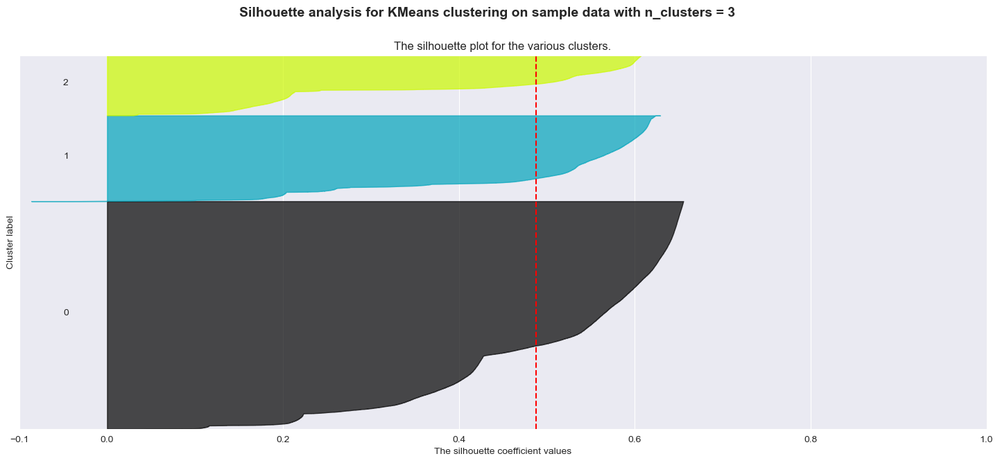

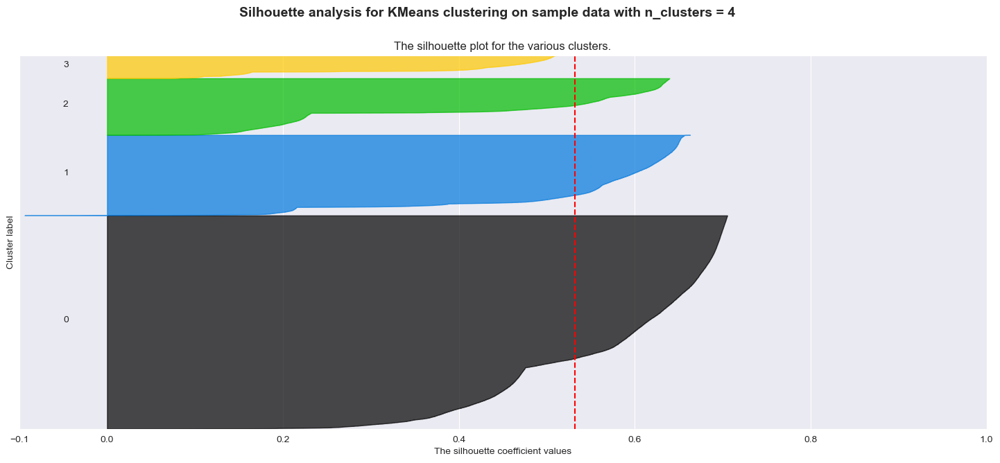

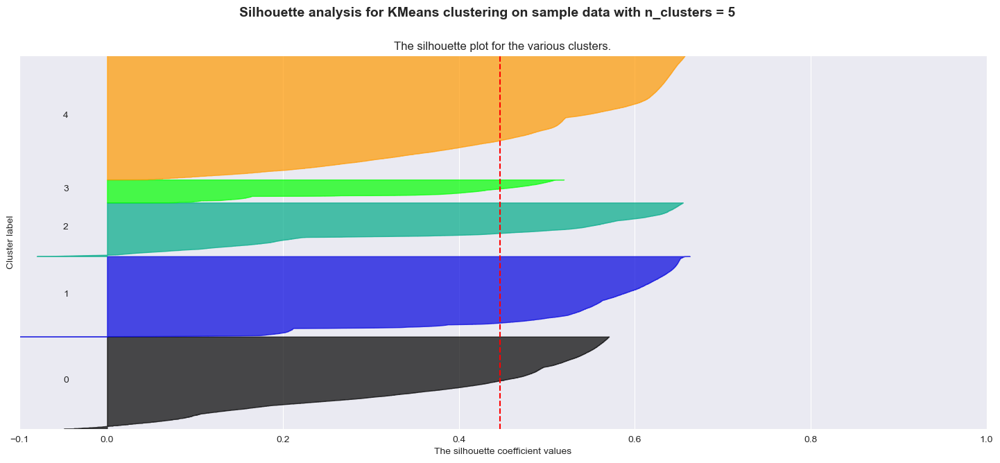

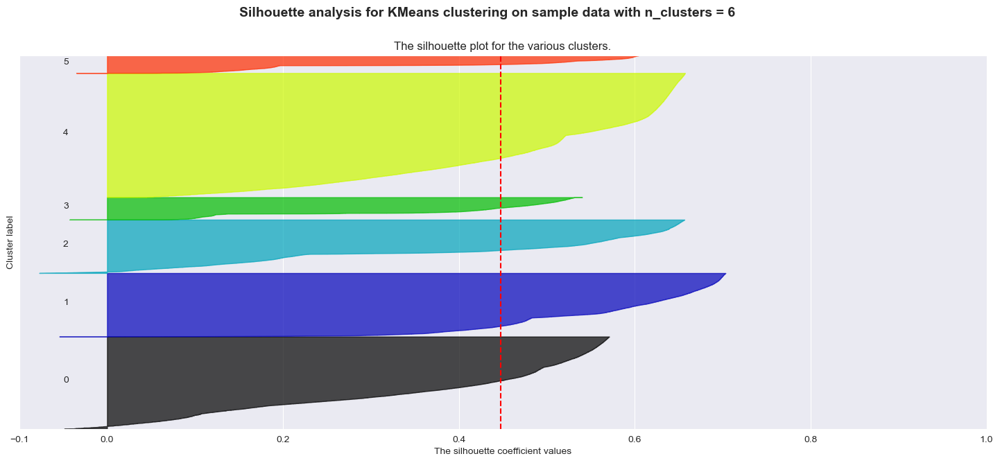

In [9]:
#trouvons le meilleur nombre de clusters
range_n_clusters = [3, 4, 5,6]
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Je décide de prendre 4 clusters avec mon X MinMaxScalé

In [11]:
# X MinMaxScaler 4 clusters
clustererKmeans = KMeans(n_clusters=4, n_init="auto", random_state=10)
cluster_labels_kmeans = clustererKmeans.fit_predict(X)
silhouette_avg = silhouette_score(X, cluster_labels_kmeans)
print("The average silhouette_score is : ",silhouette_avg)

The average silhouette_score is :  0.5317446270909342


In [12]:
np.unique(cluster_labels_kmeans)

array([0, 1, 2, 3])

In [13]:
data_results_kmeans=data.copy()
data_results_kmeans['kmeans_4']=cluster_labels_kmeans
centroids_table_kmeans=data_results_kmeans.groupby('kmeans_4').mean().reset_index()
centroids_table_kmeans

,kmeans_4,more_than_one_order,recence_days,average_payment,review_fillna,credit_card_percentage
0,0,0.0,234.140941,157.874224,4.744350,0.997600
1,1,0.0,248.742863,135.447514,4.159618,0.012419
2,2,0.0,237.477386,173.251067,1.916969,0.994295
3,3,1.0,264.488003,144.332462,4.218957,0.769313


In [14]:
fig = px.parallel_coordinates(centroids_table_kmeans, color='kmeans_4',
                              dimensions=['more_than_one_order','recence_days',
                                          'average_payment','review_fillna', 'credit_card_percentage'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [39]:
X_results_kmeans=X.copy()
X_results_kmeans=pd.DataFrame(X_results_kmeans)
X_results_kmeans['kmeans_4']=cluster_labels_kmeans
centroids_X_results_kmeans=X_results_kmeans.groupby('kmeans_4').mean().reset_index()
centroids_X_results_kmeans.drop(columns='kmeans_4',inplace=True)
centroids_X_results_kmeans=centroids_X_results.values

AttributeError: 'numpy.ndarray' object has no attribute 'values'

### ACP sur kmeans_4

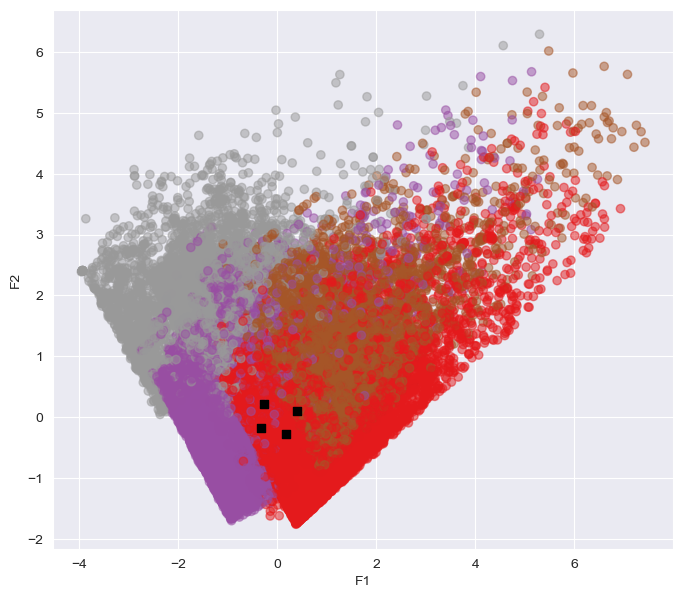

In [25]:

from sklearn.decomposition import PCA
#stockafe des labels et centroids des clusters
labels=cluster_labels_kmeans
centroids=centroids_X_results
#on fait l'ACP à 3 dimensions
pca = PCA(n_components=3)
pca.fit(X3)
#on projette les points dans le nouvel espace
X_proj = pca.transform(X3)
X_proj = pd.DataFrame(X_proj, columns = ["PC1", "PC2", "PC3"])
centroids_proj=pca.transform(centroids_X_results)
centroids_proj=pd.DataFrame(centroids_proj, columns = ["PC1", "PC2", "PC3"])
#centroids_proj = pca.transform(centroids)
# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,7))

# On affiche nos individus, avec une transparence de 50% (alpha=0.5) : 
ax.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1], c= labels, cmap="Set1", alpha =0.5)

# On affiche nos centroides, avec une couleur noire (c="black") et une frome de carré (marker="c") : 
ax.scatter(centroids_proj.iloc[:, 0], centroids_proj.iloc[:, 1],  marker="s", c="black" )

# On spécifie les axes x et y :
ax.set_xlabel("F1")
ax.set_ylabel("F2")
plt.show()

In [17]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

In [18]:
features=['more_than_one_order','recence_days','average_payment','review_fillna','credit_card_percentage']

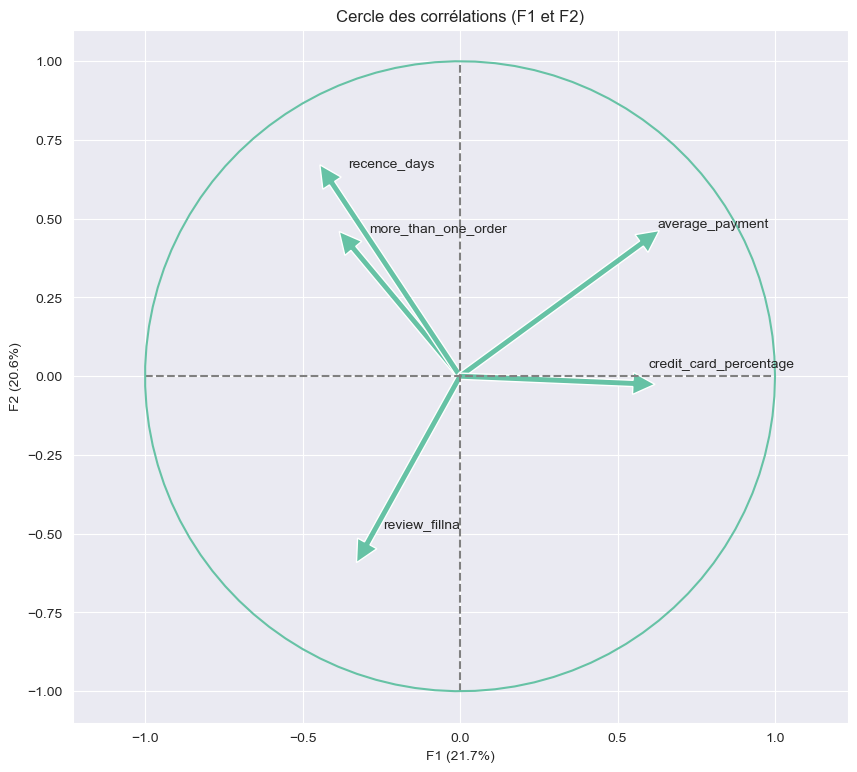

In [19]:
correlation_graph(pca,(0,1),features)

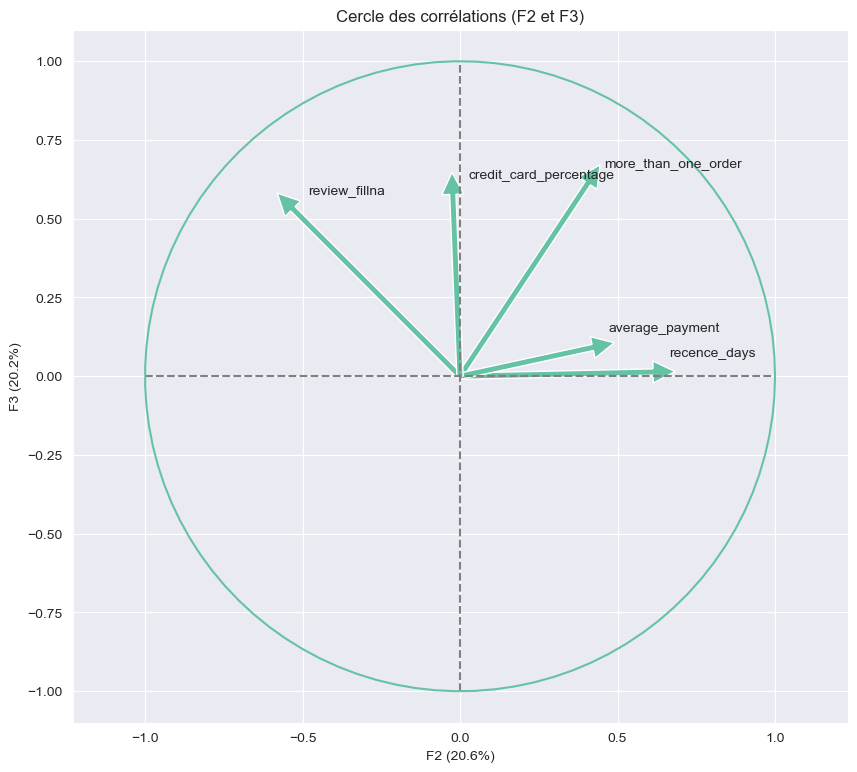

In [20]:
correlation_graph(pca,(1,2),features)

In [21]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()

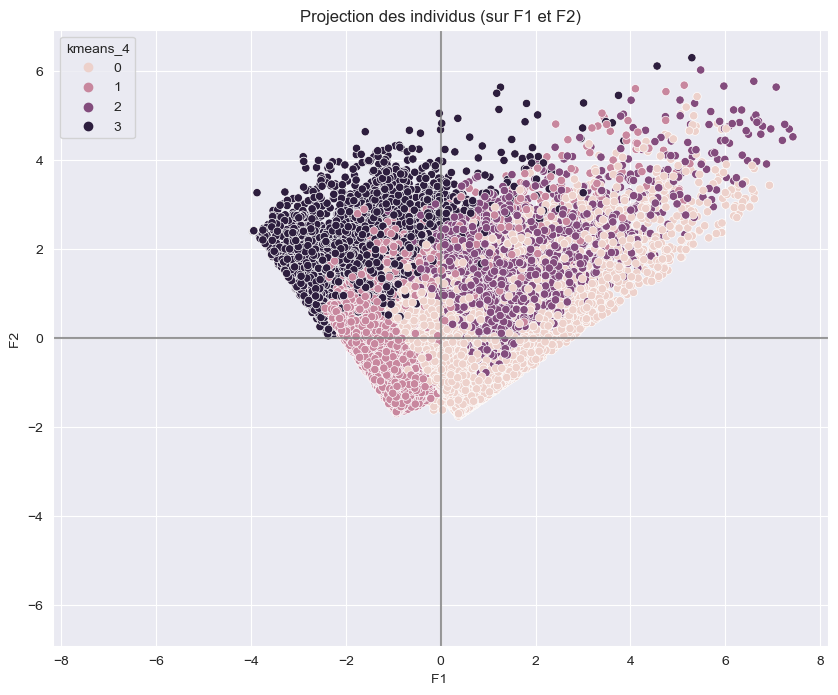

In [26]:
display_factorial_planes(X_proj, (0,1), clusters=data_results_kmeans['kmeans_4'])

Text(0.5, 0, 'F3')

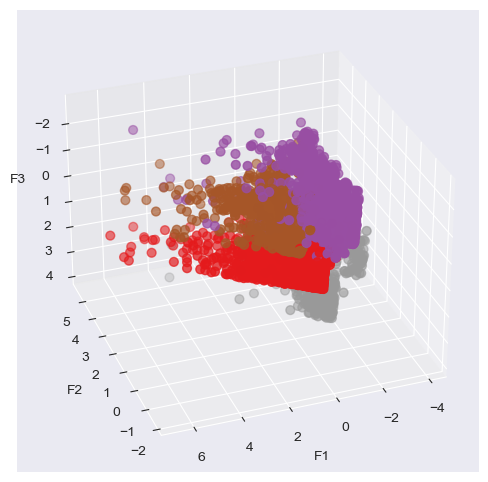

In [28]:
#sample pour y voir plus clair
X_proj_sample=X_proj.sample(10000)
sample_index=X_proj_sample.index
labels_sample=labels[sample_index]
# On définit notre figure et notre axe différemment : 
fig= plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

# On affiche nos points : 
ax.scatter(
    X_proj_sample.iloc[:, 0],
    X_proj_sample.iloc[:, 1],
    X_proj_sample.iloc[:, 2],
    c=labels_sample, cmap="Set1", s=40)

# Ajouter les centroids comme des ronds blancs
ax.scatter(
    centroids_proj.iloc[:, 0],
    centroids_proj.iloc[:, 1],
    centroids_proj.iloc[:, 2],
    c="white",
    edgecolors="black",
    s=200,
    alpha=1,
    linewidths=2,
    marker="o",
    depthshade=False
)

# On spécifie le nom des axes : 
ax.set_xlabel("F1")
ax.set_ylabel("F2")
ax.set_zlabel("F3")


In [29]:
import plotly.graph_objs as go
fig = px.scatter_3d(x=X_proj_sample.iloc[:,0], y=X_proj_sample.iloc[:,1], z=X_proj_sample.iloc[:, 2],          color=labels_sample)
fig.add_trace(go.Scatter3d(
    x=centroids_proj.iloc[:, 0],
    y=centroids_proj.iloc[:, 1],
    z=centroids_proj.iloc[:, 2],
    mode='markers',
    marker=dict(
        color='white',
        size=10,
        opacity=1,
        line=dict(color='black')
)))

fig.update_layout(scene=dict(xaxis_title="F1", yaxis_title="F2", zaxis_title="F3"))

fig.show()

# <a name="C4">4. CAH</a>
<a href="#C0">SOMMAIRE</a>

In [60]:
#sample pour y voir plus clair
selected_data = data.reset_index(drop=True).sample(10000)
selected_index=selected_data.index
selected_X=X[selected_index]

In [89]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

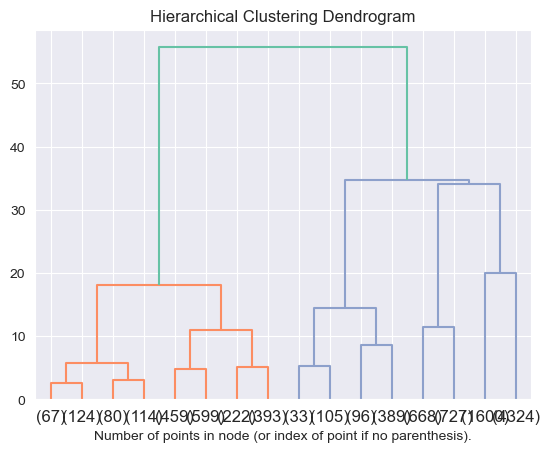

In [91]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(selected_X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

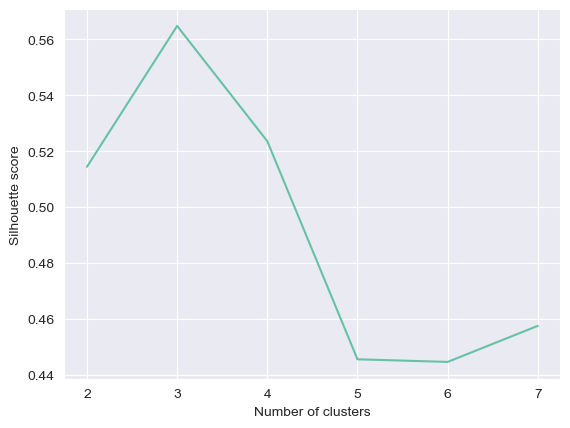

In [93]:
# clusters range to study
n_clusters_range = range(2, 8)

# silhouette score pour chaque 
silhouette_scores = []
for n_clusters in n_clusters_range:
    model = AgglomerativeClustering(distance_threshold=None, n_clusters=n_clusters)
    model = model.fit(selected_X)
    labels_cah = model.labels_
    silhouette_scores.append(silhouette_score(selected_X, labels_cah))

# plot the silhouette scores as a function of the number of clusters
plt.plot(n_clusters_range, silhouette_scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

In [94]:
#on prend 3 clusters
model_cah_3 = AgglomerativeClustering(distance_threshold=None, n_clusters=3)
model_cah_3 = model_cah_3.fit(selected_X)
labels_cah_3 = model_cah_3.labels_
silhouette_score(selected_X, labels_cah_3)

0.5648349552145915

In [95]:
data_results_cah=selected_data.copy()
data_results_cah['cah_clusters']=labels_cah_3
data_results_cah
X_proj_selected_cah=X_proj.values[selected_index]
X_proj_selected_cah=pd.DataFrame(X_proj_selected_cah)
X_proj_selected_cah

,0,1,2
0,0.878718,-1.024409,0.529667
1,1.000296,-0.688912,0.096626
2,0.712444,-0.708795,0.067286
3,0.621768,-1.498172,0.464522
4,-0.804691,-1.449946,-0.933957
...,...,...,...
9995,0.288288,0.398576,0.121150
9996,2.098149,-0.130370,0.249763
9997,-0.809824,-1.447743,-0.934261
9998,-0.367893,0.077186,0.504059


In [96]:
fig = px.scatter_3d(x=X_proj_selected_cah.iloc[:,0], 
                    y=X_proj_selected_cah.iloc[:,1], 
                    z=X_proj_selected_cah.iloc[:, 2],
                    color=data_results_cah['cah_clusters'])


fig.update_layout(scene=dict(xaxis_title="F1", yaxis_title="F2", zaxis_title="F3"))

fig.show()

In [97]:
table_cah=pd.pivot_table(data_results_cah,columns='cah_clusters',aggfunc=np.mean)
table_cah.round(2)

cah_clusters,0,1,2
average_payment,159.29,138.75,149.93
credit_card_percentage,1.00,0.01,0.78
more_than_one_order,0.00,0.00,1.00
recence_days,232.65,247.41,256.91
review_fillna,4.14,4.17,4.16


In [98]:
centroids_table_data=data_results_cah.groupby('cah_clusters').mean().reset_index()
centroids_table_data
fig = px.parallel_coordinates(centroids_table_data, color='cah_clusters',
                              dimensions=['more_than_one_order','recence_days',
                                          'average_payment','review_fillna', 'credit_card_percentage'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

# <a name="C5">5. DBScan</a>
<a href="#C0">SOMMAIRE</a>

In [99]:
from sklearn.cluster import DBSCAN
from sklearn.model_selection import GridSearchCV

In [117]:
for eps in [0.10,0.25, 0.5, 0.75]:
    for min_samples in [5, 10,50,100] : 
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(selected_X)
        dbscan_labels=dbscan.labels_
        num_noise_points = np.count_nonzero(dbscan_labels == -1)
        print('eps =' + str(eps) + ', min_samples =' + str(min_samples) + '\n' 
        'nb de clusters = ' + str(len(np.unique(dbscan_labels)))+ '\n'
        ' bruit ? ' + str(round(num_noise_points/10000*100,2))+'%')
        if len(np.unique(dbscan_labels)) > 1 :
            silhouettescore=silhouette_score(selected_X, dbscan_labels)
            print('silhouette score = '+str(silhouettescore))
        print('_____________________________')

eps =0.1, min_samples =5
nb de clusters = 24
 bruit ? 2.52%
silhouette score = 0.2278604954332443
_____________________________
eps =0.1, min_samples =10
nb de clusters = 17
 bruit ? 4.06%
silhouette score = 0.24295685114002222
_____________________________
eps =0.1, min_samples =50
nb de clusters = 11
 bruit ? 10.12%
silhouette score = 0.24747132566558502
_____________________________
eps =0.1, min_samples =100
nb de clusters = 7
 bruit ? 20.17%
silhouette score = 0.18908478311952423
_____________________________
eps =0.25, min_samples =5
nb de clusters = 14
 bruit ? 0.26%
silhouette score = 0.2665197218405494
_____________________________
eps =0.25, min_samples =10
nb de clusters = 11
 bruit ? 0.51%
silhouette score = 0.2982272452196968
_____________________________
eps =0.25, min_samples =50
nb de clusters = 9
 bruit ? 2.24%
silhouette score = 0.5197694620480122
_____________________________
eps =0.25, min_samples =100
nb de clusters = 7
 bruit ? 4.09%
silhouette score = 0.515510523

Nous allons donc choisir les hyperparamètres suivant :
eps =0.25, min_samples =100
nb de clusters = 7
 bruit ? 4.09%
silhouette score = 0.5155105232504489

In [119]:
dbscan = DBSCAN(eps=0.25, min_samples=100)
dbscan.fit(selected_X)
dbscan_labels=dbscan.labels_
num_noise_points = np.count_nonzero(dbscan_labels == -1)
print('eps =' + str(eps) + ', min_samples =' + str(min_samples) + '\n' 
      'nb de clusters = ' + str(len(np.unique(dbscan_labels)))+ '\n'
      ' bruit ? ' + str(round(num_noise_points/10000*100,2))+'%')
silhouettescore=silhouette_score(selected_X, dbscan_labels)
print('silhouette score = '+str(silhouettescore))

eps =0.75, min_samples =100
nb de clusters = 7
 bruit ? 4.09%
silhouette score = 0.5155105232504489


In [120]:
data_results_dbscan=selected_data.copy()
data_results_dbscan['dbscan_clusters']=dbscan_labels
data_results_dbscan
X_proj_selected_dbscan=X_proj.values[selected_index]
X_proj_selected_dbscan=pd.DataFrame(X_proj_selected_dbscan)
X_proj_selected_dbscan

,0,1,2
0,0.878718,-1.024409,0.529667
1,1.000296,-0.688912,0.096626
2,0.712444,-0.708795,0.067286
3,0.621768,-1.498172,0.464522
4,-0.804691,-1.449946,-0.933957
...,...,...,...
9995,0.288288,0.398576,0.121150
9996,2.098149,-0.130370,0.249763
9997,-0.809824,-1.447743,-0.934261
9998,-0.367893,0.077186,0.504059


In [122]:
centroids_table_data_dbscan=data_results_dbscan.groupby('dbscan_clusters').mean().reset_index()
round(centroids_table_data_dbscan,2)

,dbscan_clusters,more_than_one_order,recence_days,average_payment,review_fillna,credit_card_percentage
0,-1,0.57,284.98,346.34,3.08,0.38
1,0,0.00,233.93,149.61,4.57,1.00
2,1,0.00,245.85,130.21,4.76,0.01
3,2,0.00,220.26,164.35,1.23,1.00
4,3,1.00,248.98,131.04,4.75,1.00
5,4,0.00,222.43,115.35,3.00,0.00
6,5,0.00,240.89,141.29,1.00,0.01


In [123]:
fig = px.parallel_coordinates(centroids_table_data_dbscan, color='dbscan_clusters',
                              dimensions=['more_than_one_order','recence_days',
                                          'average_payment','review_fillna', 'credit_card_percentage'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [125]:
fig = px.scatter_3d(x=X_proj_selected_dbscan.iloc[:,0], 
                    y=X_proj_selected_dbscan.iloc[:,1], 
                    z=X_proj_selected_dbscan.iloc[:, 2],
                    color=data_results_dbscan['dbscan_clusters'])


fig.update_layout(scene=dict(xaxis_title="F1", yaxis_title="F2", zaxis_title="F3"))

fig.show()

In [160]:
#afffichage sans le bruit
X_proj_selected_dbscan_sans_bruit=X_proj_selected_dbscan.copy()
X_proj_selected_dbscan_sans_bruit['dbscan_clusters']=data_results_dbscan['dbscan_clusters'].reset_index(drop=True)
X_proj_selected_dbscan_sans_bruit=X_proj_selected_dbscan_sans_bruit[X_proj_selected_dbscan_sans_bruit['dbscan_clusters']!=-1]

In [163]:
fig = px.scatter_3d(x=X_proj_selected_dbscan_sans_bruit.iloc[:,0], 
                    y=X_proj_selected_dbscan_sans_bruit.iloc[:,1], 
                    z=X_proj_selected_dbscan_sans_bruit.iloc[:, 2],
                    color=X_proj_selected_dbscan_sans_bruit['dbscan_clusters'])


fig.update_layout(scene=dict(xaxis_title="F1", yaxis_title="F2", zaxis_title="F3"))

fig.show()

# <a name="C6">6. X2, Kmeans, sans la première variable</a>
<a href="#C0">SOMMAIRE</a>

In [164]:
data2=data.drop(columns='more_than_one_order').copy()
data2

,recence_days,average_payment,review_fillna,credit_card_percentage
Unnamed: 0,,,,
0,470,146.87,4.0,1.0
1,229,335.48,5.0,1.0
2,102,157.73,5.0,1.0
3,169,173.30,5.0,1.0
4,31,252.25,5.0,1.0
...,...,...,...,...
96473,144,88.78,4.0,1.0
96474,147,129.06,5.0,1.0
96475,143,56.04,1.0,1.0


In [165]:
#scaling data
scaler = StandardScaler()
scaler.fit(data2)
X2=scaler.transform(data2)
print(X2)

[[ 1.50761592 -0.04335248 -0.12274054  0.55060619]
 [-0.06975576  1.02189718  0.65943707  0.55060619]
 [-0.90098481  0.01798367  0.65943707  0.55060619]
 ...
 [-0.63263527 -0.55635087 -2.46927336  0.55060619]
 [ 0.38840199  3.14319044  0.65943707  0.55060619]
 [ 0.0873269  -0.74990427  0.65943707  0.55060619]]


For n_clusters = 3 The average silhouette_score is : 0.38996452166589085
For n_clusters = 4 The average silhouette_score is : 0.3577960006516624
For n_clusters = 5 The average silhouette_score is : 0.38511303159937105
For n_clusters = 6 The average silhouette_score is : 0.379316210152696


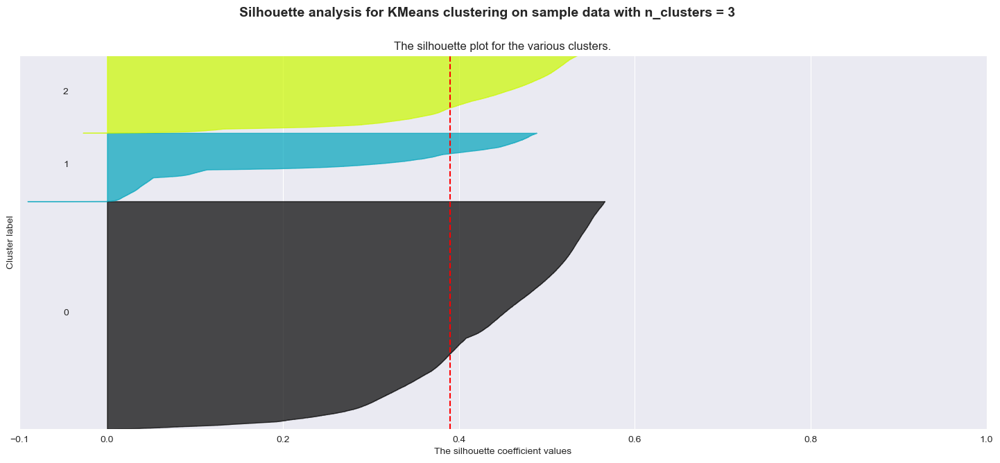

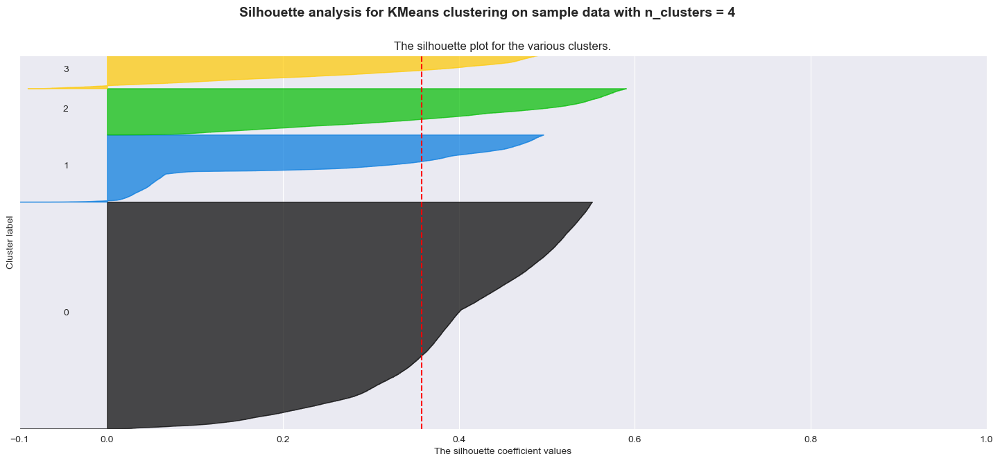

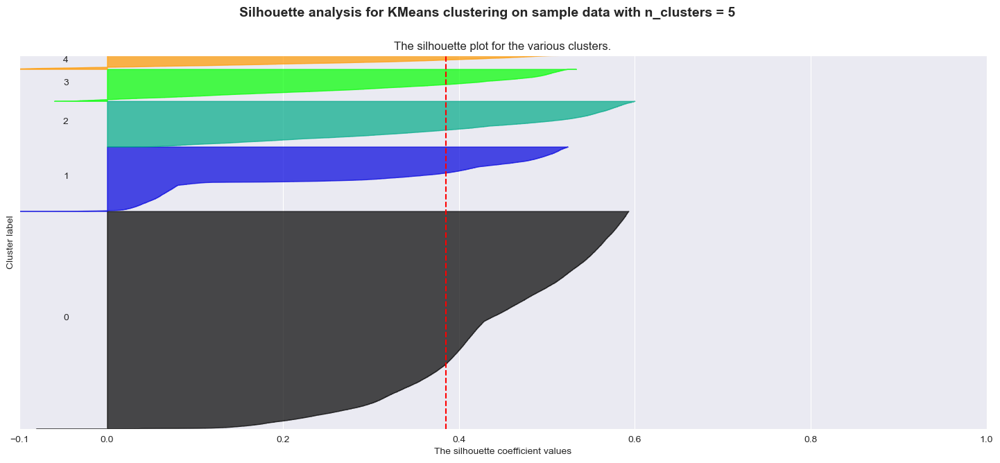

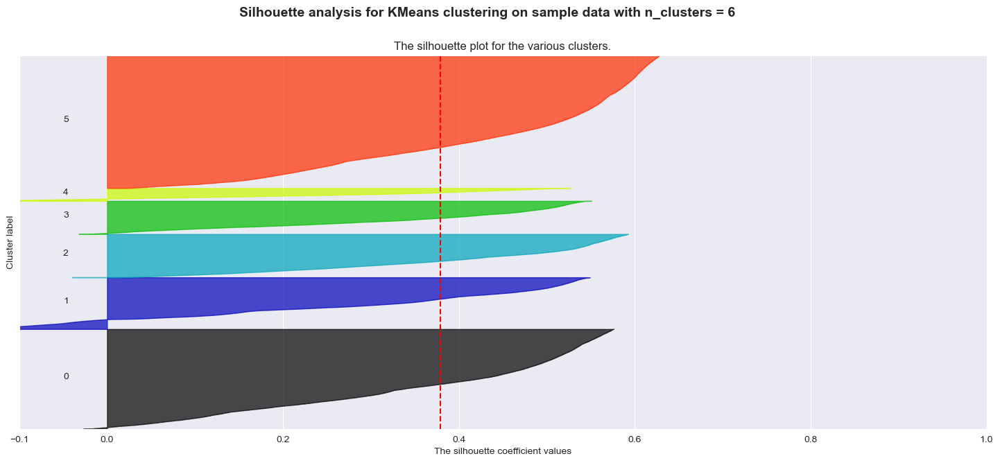

In [166]:
#trouvons le meilleur nombre de clusters
range_n_clusters = [3, 4, 5,6]
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(X2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X2, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X2, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()



# <a name="C7">7. Choix du modèle (kmeans n=4)</a>
<a href="#C0">SOMMAIRE</a>

**Conclusion :** Les méthodes DBSCAN et CAH demandent beaucoup de mémoire, et ne sont pas réutilisables nous allons donc choisir la méthode kmeans :Le meilleur clustering provient de 4 clusters. C'est donc ce dernier que nous allons choisir et sauvegarder pour faire une proposition de contrat de maintenance. 

In [167]:
data_results_kmeans

,more_than_one_order,recence_days,average_payment,review_fillna,credit_card_percentage,kmeans_4
Unnamed: 0,,,,,,
0,0,470,146.87,4.0,1.0,0
1,0,229,335.48,5.0,1.0,0
2,0,102,157.73,5.0,1.0,0
3,0,169,173.30,5.0,1.0,0
4,0,31,252.25,5.0,1.0,0
...,...,...,...,...,...,...
96473,0,144,88.78,4.0,1.0,0
96474,0,147,129.06,5.0,1.0,0
96475,0,143,56.04,1.0,1.0,2


In [168]:
X_proj

,PC1,PC2,PC3
0,-0.212422,0.854381,0.112004
1,0.811739,-0.078745,0.604017
2,0.571121,-1.011083,0.501267
3,0.443598,-0.705280,0.515144
4,1.067498,-1.071009,0.543814
...,...,...,...
96273,0.465553,-0.591523,0.053595
96274,0.358156,-0.898784,0.490410
96275,1.053132,0.571957,-1.210717
96276,1.847691,1.095643,0.803817


In [169]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
T = tsne.fit_transform(X_proj.copy())

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:title={'center':'Représentation du jeu de données via T-SNE'}>

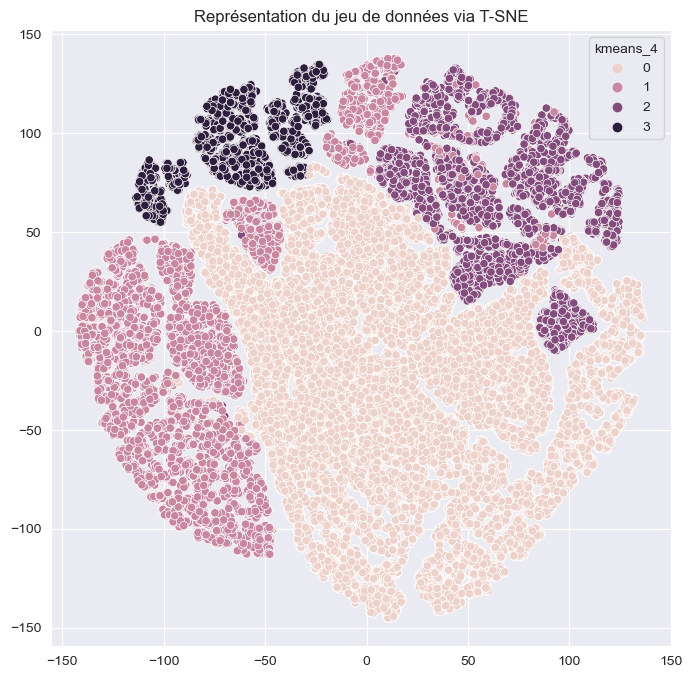

In [171]:
plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(T[:,0], T[:,1],hue=data_results_kmeans['kmeans_4'])
